<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW5_boosting_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## **Домашняя работа 5: Бустинг и кластеризация**

### **Постановка задачи:**

В этой работы ваша задача подразделена на части:

*   В первой части вам предстоит реалищовать класс бустинга и сравнить его со встроенными классами популярных библиотек;
*   Во второй части вам предстоит применить алгоритмы кластеризации в задаче  разделения изображения на семантические компоненты;

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**

## **Часть 1: построение класса алгоритма бустинга**

**Количество баллов:** 7

Начнём с нужных библиотек и загрузки данных. Работать будем с датасетом из Kaggle и с синтетическим датасетом.

Данные c Kaggle связаны с телефонной рекламой португальского банковского учреждения. Цель классификации — спрогнозировать, подпишется ли клиент на срочный депозит (переменная y).

Всего в данных 20 признаков, ознакомиться с признаковым описанием можно [здесь](https://www.kaggle.com/code/sachinrajput17/subscription-prediction-for-bank-marketing-data).

Будем действовать из предположений, что датасет достаточно хорош, чтобы мы уже могли построить на нём базовую модель.

In [107]:
import numpy as np
import pandas as pd
import plotly.express as px

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier

In [2]:
!wget  -O 'bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [3]:
df = pd.read_csv('bank_data.csv') 
df.sample(5) 

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
4234,28,services,married,basic.9y,no,yes,no,telephone,oct,fri,...,1,999,1,failure,-3.4,92.431,-26.9,0.739,5017.5,1
7671,46,admin.,married,university.degree,unknown,yes,no,cellular,jul,tue,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,-1
8789,33,services,single,high.school,no,yes,no,telephone,may,fri,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.864,5191.0,-1
3817,30,admin.,married,high.school,no,yes,no,cellular,may,mon,...,1,999,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1,-1
2213,72,retired,married,basic.4y,no,no,yes,cellular,jul,fri,...,4,8,1,success,-1.7,94.215,-40.3,0.822,4991.6,1


Разделим на train и test (random_state не меняем)

In [4]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

Генерируем синтетические данные (seed не меняем)

In [5]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [6]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''

    mask = np.random.choice([True, False], size=features.shape[0],
                            p=[examples_density, 1.0 - examples_density])
    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps

    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)

    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)
    if mode == 'classification':
        predicts = model.predict_proba(grid)[:, 1].reshape(steps, steps)
        values = (targets[mask] == 1).astype(np.float)
    elif mode == 'regression':
        predicts = model.predict(grid).reshape(steps, steps)
        values = targets[mask]
    else:
        raise ValueError('Unknown mode')

    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()

    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

### **Задание 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации**

Реализовывать класс буситнга необходимо согласно его теоретическому описанию. Вы начинаете с параметрами:

- `base_model_class=DecisionTreeRegressor` — базовая модель
- `base_model_params: dict={'max_features': 0.1}` — параметрмы базовой модели, рассчет максимального количества признаков полагаем как: `max(1, int(max_features * n_features_in_))`
- `n_estimators: int=10` — количество моделей
- `learning_rate: float=0.1` — скорость обучения
- `subsample: float=0.3` — доля данных, которая будет использоваться для подбора отдельных алгоритмов.
— `random_seed: int=228` — тут как всегда
– `custom_loss: list or tuple=None` — функция потерь
— `use_best_model: bool=False` — использовать ли при вызове predict и predict_proba лучшее с точки зрения валидационной выборки число деревьев в композиции
— `n_iter_early_stopping: int=None` — ранний критерий остановки

**Примечание:**

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже).

**Примечание 2:**

Нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [43]:
class Boosting:
    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params={'max_features': 0.1},
        n_estimators=10,
        learning_rate=0.1,
        subsample=0.3,
        random_seed=228,
        custom_loss=None,
        use_best_model=False,
        n_iter_early_stopping=None
    ):
        self.base_model_class = base_model_class
        self.base_model_params = base_model_params
        self.n_estimators = n_estimators
        self.learning_rate = learning_rate
        self.subsample = subsample
        self.random_seed = random_seed
        self.use_best_model = use_best_model
        self.n_iter_early_stopping = n_iter_early_stopping

        self.initial_model_pred = None
        self.gammas = []
        self.models = []
        
        np.random.seed(self.random_seed)

        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.sigmoid = lambda z: 1 / (1 + np.exp(-z))
            self.loss_fn = lambda y, z: -np.log(self.sigmoid(y * z)).mean()
            self.loss_derivative = lambda y, z: -y * self.sigmoid(-y * z)

    def _fit_initial_model(self, X, y):
        self.initial_model_pred = np.log(np.mean(y) / (1 - np.mean(y)))

    def _fit_new_model(self, X, y, n_model):
        residuals = -self.loss_derivative(y, self.predict_raw(X))
        model = self.base_model_class(**self.base_model_params)
        sample_size = int(self.subsample * X.shape[0])
        indices = np.random.choice(X.shape[0], sample_size, replace=False)
        model.fit(X[indices], residuals[indices])
        new_predictions = model.predict(X)
        gamma = self._find_optimal_gamma(y, self.predict_raw(X), new_predictions)
        self.models.append(model)
        self.gammas.append(gamma)

    def _find_optimal_gamma(self, y, old_predictions, new_predictions, boundaries=(0.01, 1)):
        best_gamma = 0
        best_loss = self.loss_fn(y, old_predictions)
        for gamma in np.linspace(*boundaries, 100):
            updated_pred = old_predictions + gamma * new_predictions
            loss = self.loss_fn(y, updated_pred)
            if loss < best_loss:
                best_loss = loss
                best_gamma = gamma
        return best_gamma

    def fit(self, X, y, eval_set=None):
        self._fit_initial_model(X, y)
        best_score = float('inf')
        best_n = 0
        for n in range(self.n_estimators):
            self._fit_new_model(X, y, n)
            if eval_set:
                X_val, y_val = eval_set
                score = self.loss_fn(y_val, self.predict_raw(X_val))
                if score < best_score:
                    best_score = score
                    best_n = n
                elif self.n_iter_early_stopping and (n - best_n) >= self.n_iter_early_stopping:
                    break
        if self.use_best_model:
            self.models = self.models[:best_n + 1]
            self.gammas = self.gammas[:best_n + 1]

    def predict_raw(self, X):
        pred = np.full(X.shape[0], self.initial_model_pred)
        for model, gamma in zip(self.models, self.gammas):
            pred += gamma * model.predict(X)
        return pred

    def predict_proba(self, X):
        raw_pred = self.predict_raw(X)
        return self.sigmoid(raw_pred)

    def predict(self, X):
        return (self.predict_proba(X) > 0.5).astype(int)

    @property
    def feature_importances_(self):
        importance = np.zeros(self.models[0].n_features_in_)
        for model, gamma in zip(self.models, self.gammas):
            importance += gamma * model.feature_importances_
        return importance / np.sum(importance)


## **Тест для вашей имплементации.**

Если класс написан правильно, две следующие ячейки должна отработать без ошибок и относительно быстро (у автора задания 2 и 0.2 секунд соответственно, accuracy 0.911 и 0.879 соответственно). Если у вас получилось качество выше указанного — отлично!

In [8]:
%%time

boosting = Boosting()
boosting.fit(X_train_synthetic, y_train_synthetic)
# Без разницы, выдает эта строка классы или вероятности

preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.88195
CPU times: user 2.45 s, sys: 177 ms, total: 2.62 s
Wall time: 2.71 s


In [9]:
%%time

boosting = Boosting()
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)) > 0.87)

False
CPU times: user 217 ms, sys: 36.7 ms, total: 253 ms
Wall time: 284 ms


### **Задание 2. (1.2 балла) Сравнение с базовыми моделями**

- Сравните результаты вашей имплементации бустинга, где в качестве базовых моделей используйте алгоритмы, перечисленные ниже. Сравнение проводите на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. Данные берите из реальной задачи (bank_data).
- Ответьте на поставленные вопросы

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

In [44]:
from sklearn.metrics import f1_score

boosting_tree = Boosting(base_model_class=DecisionTreeRegressor, base_model_params={"max_depth": 6})
boosting_tree.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
tree_preds = np.round(boosting_tree.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
print(f'Accuracy DT = {accuracy_score((df_test.y.values == 1), tree_preds)}')
print(f'F1_score DT = {f1_score((df_test.y.values == 1), tree_preds)}')
print('-----------------------------')

boosting_forest = Boosting(base_model_class=RandomForestRegressor, base_model_params={"n_estimators": 100})
boosting_forest.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
forest_preds = np.round(boosting_forest.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
print(f'Accuracy RF = {accuracy_score((df_test.y.values == 1), forest_preds)}')
print(f'F1_score RF = {f1_score((df_test.y.values == 1), forest_preds)}')
print('-----------------------------')

boosting_linreg = Boosting(base_model_class=LinearRegression, base_model_params={})
boosting_linreg.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
linreg_preds = np.round(boosting_linreg.predict((df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5))
print(f'Accuracy LR = {accuracy_score((df_test.y.values == 1), linreg_preds)}')
print(f'F1_score LR = {f1_score((df_test.y.values == 1), linreg_preds)}')

Accuracy DT = 0.865301724137931
F1_score DT = 0.8573059360730594
-----------------------------
Accuracy RF = 0.8766163793103449
F1_score RF = 0.8689181453921007
-----------------------------
Accuracy LR = 0.5140086206896551
F1_score LR = 0.0


In [56]:
lr = LogisticRegression()
lr.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
logreg_preds = np.round(lr.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
print(f'Accuracy LogisticRegression = {accuracy_score((df_test.y.values == 1), logreg_preds)}')
print(f'F1_score LogisticRegression = {f1_score((df_test.y.values == 1), logreg_preds)}')

Accuracy LogisticRegression = 0.8464439655172413
F1_score LogisticRegression = 0.8436642896324741


**Вопросы:**

1) Какая из моделей имеет оптимальное качество? С чем это связано?

2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?

3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?

4) Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.

**Ваш ответ здесь**
- наиболее оптимальное качество имеет бустинг, у которого базовым алгоритмом является случайный лес, так как он показал наилучшее качество по тестовой выборке и нет явных признаков переобучения. Я считаю, что это связано с тем, что случайный лес сам по себе более точный алгоритм с меншьим разбросом, чем то же решающее дерево, но по результатам мы можем наблюдать, что решающее дерево немного отстает в качестве, но все равно показывает довольно неплохой результат
- сильнее всего переобучилась линейная регрессия. Преимущество ранней остановки есть так как мы можем с меньщими затратами получить качественное решение, но тут всегда есть вероятность того, что мы при оптимизации наткнемся на локальный минимум и так и не доберемся до глобального 
- Нет, результат бустинга над линейными регрессиями показал результат хуже, чем лог рег. Считаю, что такое может происходить так как модели оптимизируют разные функции - MSE и logloss, бустинг может переобучиться или не учиться если каждая новая модель дает те же коэффициенты

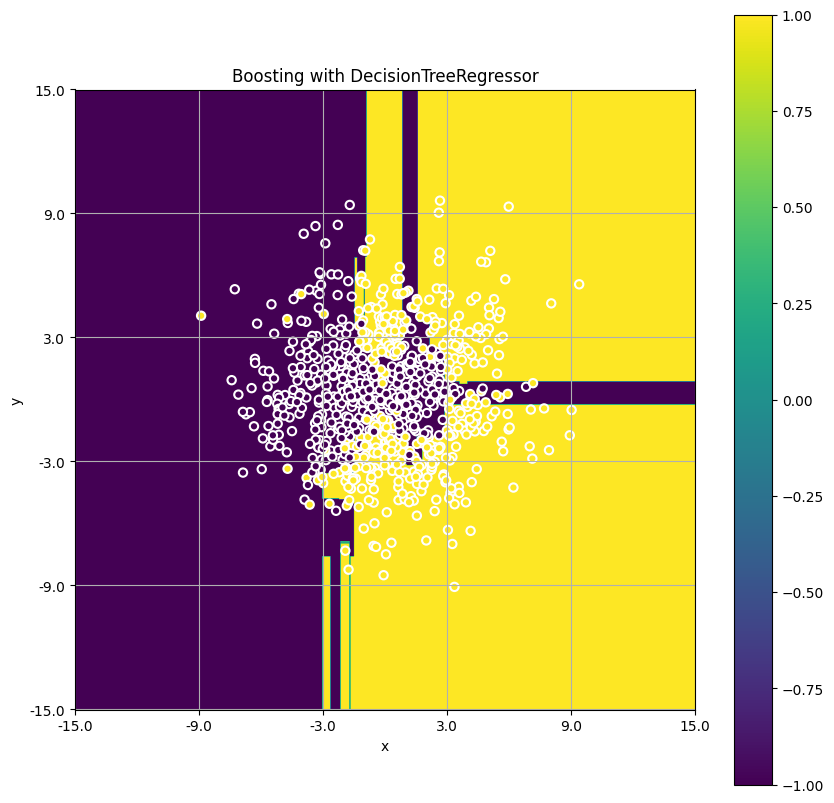

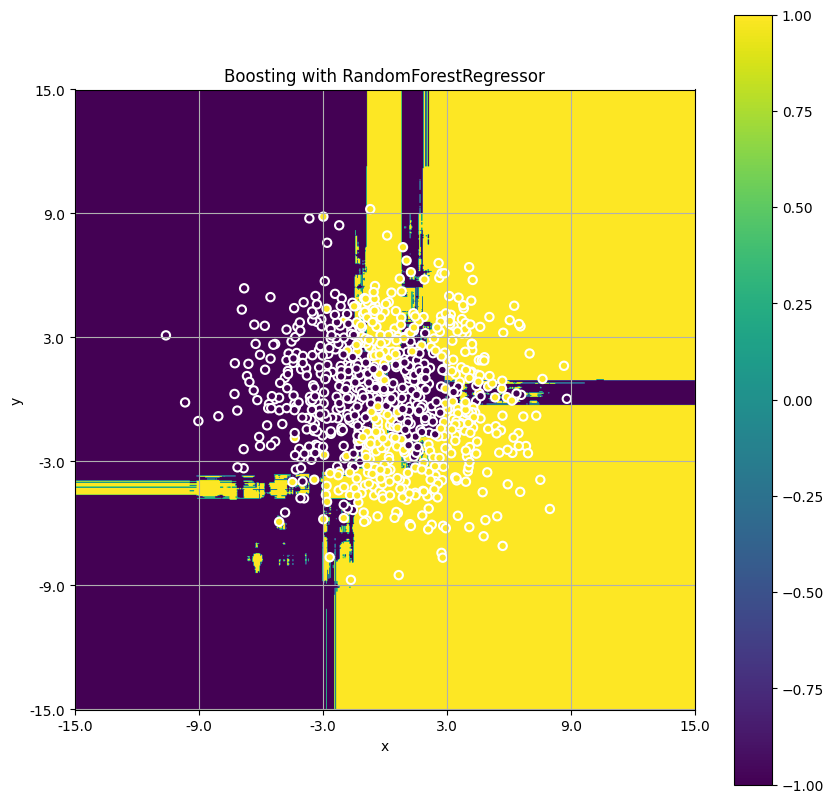

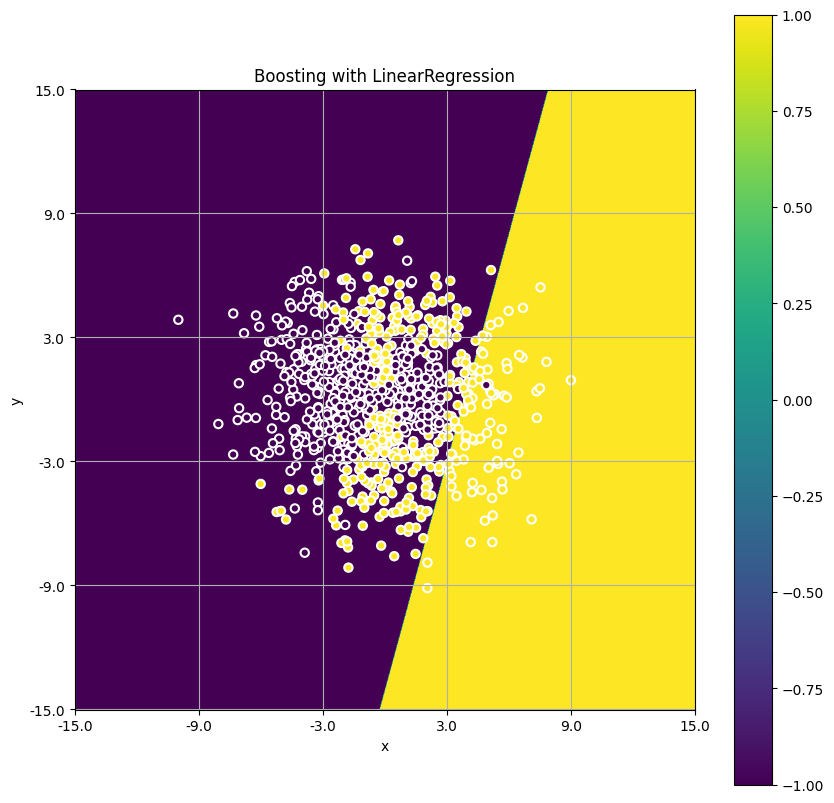

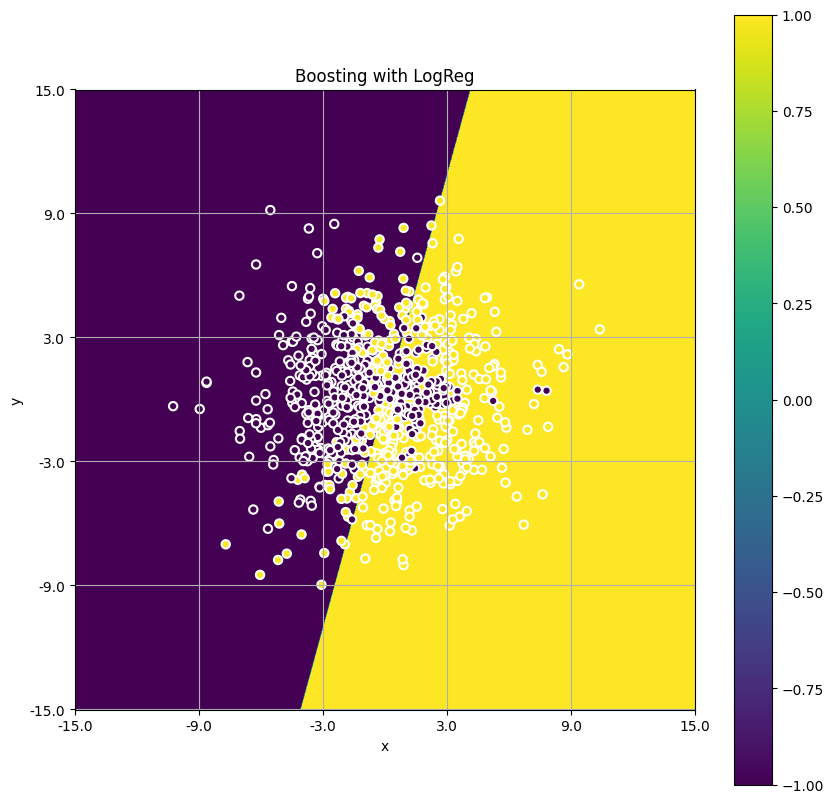

In [58]:
# X_train_synthetic, y_train_synthetic
# X_test_synthetic, y_test_synthetic 
boosting_tree = Boosting(base_model_class=DecisionTreeRegressor, base_model_params={"max_depth": 6})
boosting_tree.fit(X_train_synthetic, y_train_synthetic)

boosting_forest = Boosting(base_model_class=RandomForestRegressor, base_model_params={"n_estimators": 100})
boosting_forest.fit(X_train_synthetic, y_train_synthetic)

boosting_linreg = Boosting(base_model_class=LinearRegression, base_model_params={})
boosting_linreg.fit(X_train_synthetic, y_train_synthetic)

lr = LogisticRegression()
lr.fit(X_train_synthetic, y_train_synthetic)


plot_predicts(model=boosting_tree, 
              features=X_train_synthetic,
              targets=y_train_synthetic,
              title='Boosting with DecisionTreeRegressor',
              mode='regression')

plot_predicts(model=boosting_forest, 
              features=X_train_synthetic,
              targets=y_train_synthetic,
              title='Boosting with RandomForestRegressor',
              mode='regression')

plot_predicts(model=boosting_linreg, 
              features=X_train_synthetic,
              targets=y_train_synthetic,
              title='Boosting with LinearRegression',
              mode='regression')

plot_predicts(model=lr, 
              features=X_train_synthetic,
              targets=y_train_synthetic,
              title='Boosting with LogReg',
              mode='regression')

***Вывод по пункту 4***
- Судя по графикам можно сделать вывод, что линейной регресии тяжелее найти закономерности в данных, чем логистической из-за функции потерь
- Также видно что решающее дерево выстраивает сильно более сложный набор правил для определения класса, чем линейные модели. Но в то же время видно, что случайный лес делает этот набор правил еще более глубоким, но есть ощущение того, что он находится на грани переобучения

### **Задание 3. (0.8 балла) Сравнение с бустингами**

- Сравните на реальных данных данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией.
- Укажите, получилось ли у вас победить библиотечные реализации на тестовых данных?

**Примечание:**

Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов.


In [68]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from catboost import CatBoostClassifier



param_grid = {
    'n_estimators': [50, 100, 300],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7]
}

cat_model = CatBoostClassifier(verbose=0)
cat_grid = GridSearchCV(cat_model, param_grid, scoring='f1', cv=3, verbose=0, n_jobs=-1)
cat_grid.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
cat_preds = np.round(cat_grid.best_estimator_.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(f'Accuracy CatBoostClassifier = {accuracy_score((df_test.y.values == 1), cat_preds)}')
print(f'F1_score CatBoostClassifier = {f1_score((df_test.y.values == 1), cat_preds)}')

print('---------------------------------')

best_f1 = 0
best_params = {}

for n in param_grid['n_estimators']:
    for lr in param_grid['learning_rate']:
        for depth in param_grid['max_depth']:
            boosting_model = Boosting(
                base_model_class=DecisionTreeRegressor, 
                base_model_params={"max_depth": depth}, 
                n_estimators=n, 
                learning_rate=lr
            )
            boosting_model.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
            preds = np.round(boosting_model.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)
            f1 = f1_score((df_test.y.values == 1), preds)

            if f1 > best_f1:
                best_f1 = f1
                best_params = {'n_estimators': n, 'learning_rate': lr, 'max_depth': depth}

boosting_best = Boosting(
    base_model_class=DecisionTreeRegressor,
    base_model_params={"max_depth": best_params['max_depth']},
    n_estimators=best_params['n_estimators'],
    learning_rate=best_params['learning_rate']
)
boosting_best.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
custom_preds = np.round(boosting_best.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(f'Accuracy Custom Boosting = {accuracy_score((df_test.y.values == 1), custom_preds)}')
print(f'F1_score Custom Boosting = {f1_score((df_test.y.values == 1), custom_preds)}')

Accuracy CatBoostClassifier = 0.8970905172413793
F1_score CatBoostClassifier = 0.8973670069854917
---------------------------------
Accuracy Custom Boosting = 0.8900862068965517
F1_score Custom Boosting = 0.891604675876727


**Ваш ответ здесь**

нет, побить качество CatBoostClassifier не получилось, но результаты получились крайне близкими !

###**Задание 4. (1 балл) Капля теории**

Теоретически, мы могли бы построить бэггинг на логистических регрессиях. Оцените целесообразность такого подхода. В ответе укажите:

- Идею бэггинга и его свойства;
- Характеристики модели логистической регресии;
- Сопоставление и вывод.


Оценка целесообразности бэггинга на логистических регрессиях
1. Идея бэггинга и его свойства
Бэггинг  — это метод ансамблирования, который:
генерирует несколько обучающих выборок путём бутстрапа, после обучает несколько моделей независимо друг от друга на разных выборках. Далее усредняет (для регрессии) или голосует (для классификации) предсказания.
- Свойства бэггинга:
Снижает дисперсию модели (уменьшает переобучение).
Неэффективен, если базовые модели имеют низкую вариативность (слишком похожие модели).
2. Характеристики модели логистической регрессии
Логистическая регрессия:это линейная модель, которая предсказывает вероятность классов через сигмоиду.
При бутстрапе каждая модель будет похожа на остальные → ансамбль из логистических регрессий будет почти идентичен одной модели.
3. Сопоставление и вывод
- бэггинг эффективен когда базовые модели нестабильны и могут сильно изменяться при изменении обучающей выборки (например, деревья решений).
- Почему бэггинг на логистических регрессиях неэффективен?
Логистическая регрессия слишком устойчива к изменениям данных, те бутстрап не создаст достаточно разных моделей.
Полученный ансамбль будет почти эквивалентен одной логистической регрессии.
В отличие от деревьев, логистическая регрессия не выигрывает от усреднения.
Вывод:
Бэггинг на логистических регрессиях почти не даёт прироста в качестве, так как модели слишком похожи друг на друга.
Лучше использовать бустинг или случайный лес с более сложными моделями.

## **Часть 1: Разделение изображения на семантические компоненты**

**Количество баллов:** 3

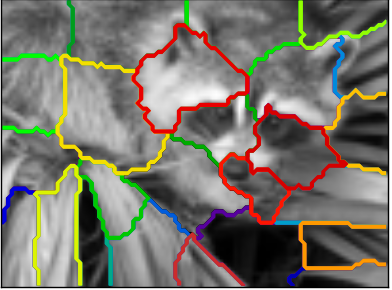

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации.

Проверим их на ```duck.jpg``` и ```owls.jpg```

### **Задание 5 (0.2 балла)**

Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

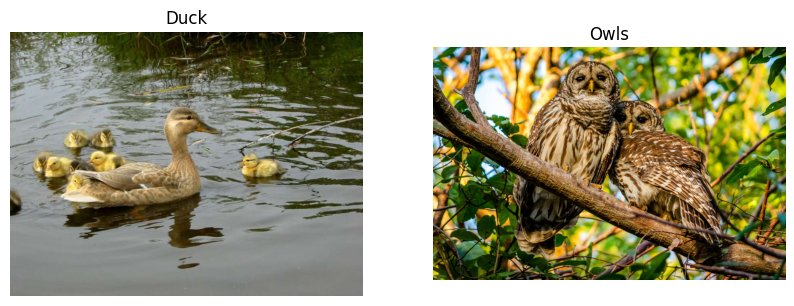

In [71]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

duck_img = mpimg.imread('duck.jpg')
owls_img = mpimg.imread('owls.jpg')

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(duck_img)
axes[0].set_title("Duck")
axes[0].axis("off")  

axes[1].imshow(owls_img)
axes[1].set_title("Owls")
axes[1].axis("off")

plt.show()

### **Задание 6 (0.8 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

- Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :))
- Проанализируйте результат

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

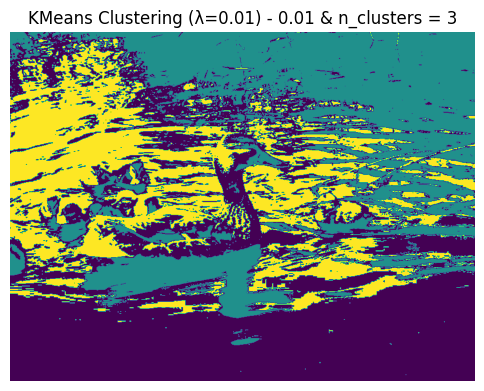

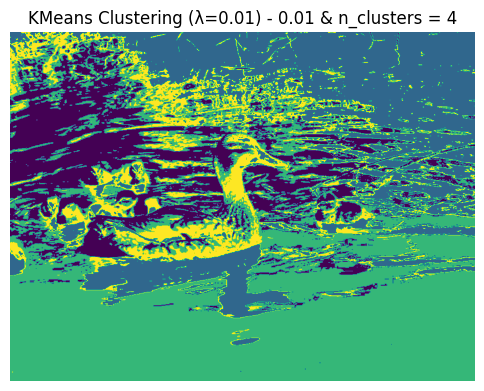

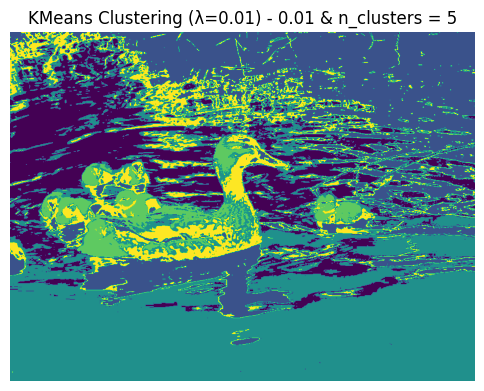

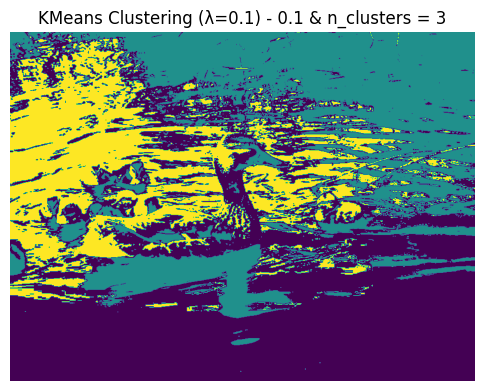

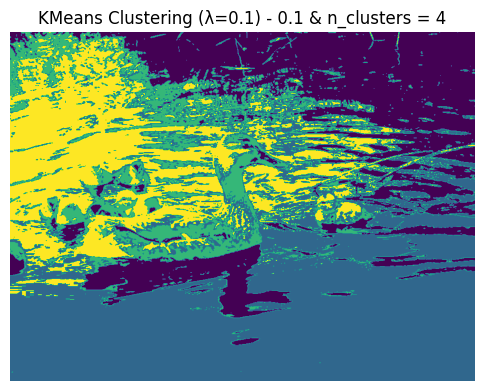

...

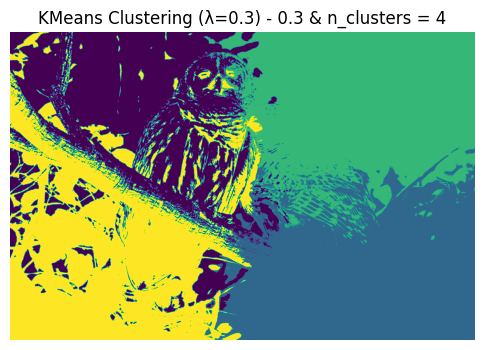

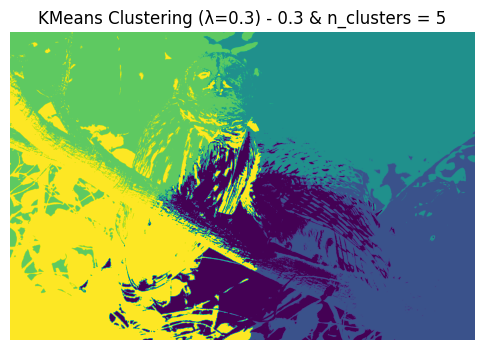

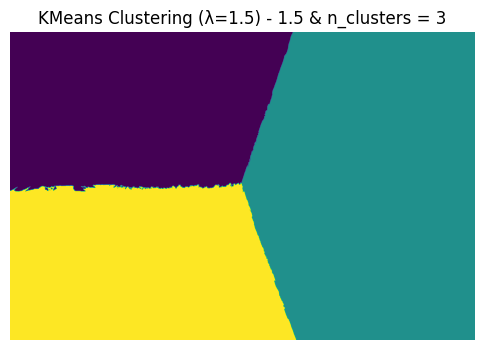

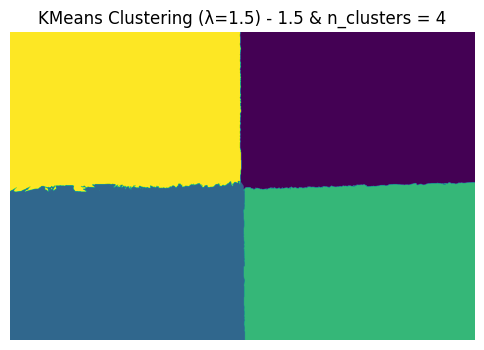

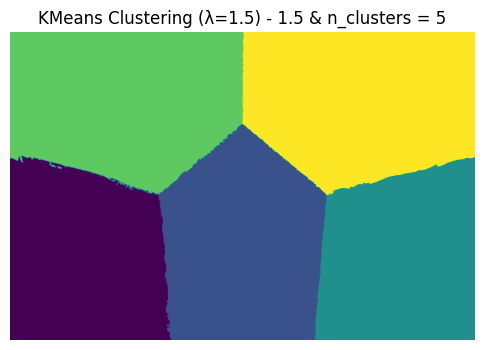

In [109]:
from sklearn.cluster import KMeans

def find_components(image, lmbd=1.0, n_clusters=3):
    img = mpimg.imread(image)
    h, w, c = img.shape  
    x_coords, y_coords = np.meshgrid(np.arange(w), np.arange(h))

    # Разворачиваем данные в векторы
    pixels = img.reshape(-1, c)  # Цвета (r, g, b)
    x_coords = x_coords.flatten()  
    y_coords = y_coords.flatten()  

    # Формируем вектор признаков [λ * x, λ * y, r, g, b]
    features = np.column_stack((lmbd * x_coords, lmbd * y_coords, pixels))

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10, )
    labels = kmeans.fit_predict(features)

    segmented_image = labels.reshape(h, w)
    plt.figure(figsize=(6, 6))
    plt.imshow(segmented_image, cmap='viridis')
    plt.title(f"KMeans Clustering (λ={lmbd}) - {lmbd} & n_clusters = {n_clusters}")
    plt.axis("off")
    plt.show()

image_paths = ["duck.jpg", "owls.jpg"]
lambdas = [0.01, 0.1, 0.3, 1.5]

for img_path in image_paths:
    for lam in lambdas:
        for cluster in range(3, 6):
            find_components(img_path, n_clusters=cluster, lmbd=lam)

**Ваш ответ здесь**
- Видно, что параметр лямбда оказывает крайне сильный эффект на результаты кластеризации, но в то же время при выставлении мелкого порогового значения мы можем получать довольно много шумных точек, которые тяжело отнести к какому-то конкретному кластеру. Судя по фотографиям - наилучий результат получается при лямбда = 0.1 и n_clusters = 4

### **Задание 7 (0.8 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [132]:
from skimage import color, transform
from skimage.io import imread
from sklearn.feature_extraction import image as img
from sklearn.feature_extraction.image import img_to_graph
from sklearn.cluster import spectral_clustering

def spectral_segmentation(image_path, n_clusters, beta=10, eps=1e-5):
    image = imread(image_path)
    image_gray = color.rgb2gray(image)
    image_resized = transform.rescale(image_gray, 0.5, anti_aliasing=True)

    graph = img.img_to_graph(image_resized)
    graph.data = np.exp(-beta * graph.data / image_resized.std()) + eps

    labels = spectral_clustering(graph, n_clusters=n_clusters, random_state=42,  assign_labels='discretize')
    labels = labels.reshape(image_resized.shape)

    plt.figure(figsize=(5, 5))
    plt.imshow(image_resized, cmap='gray')

    for cluster in range(n_clusters):
        plt.contour(
            labels == cluster,
            1,
            colors=[plt.cm.Spectral(cluster / float(n_clusters))]
        )
    
    plt.axis("off")
    plt.show()

### **Задание 8 (0.2 балла)**
- Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.
- Проанализируйте сравнение

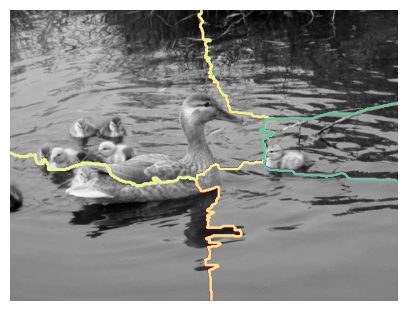

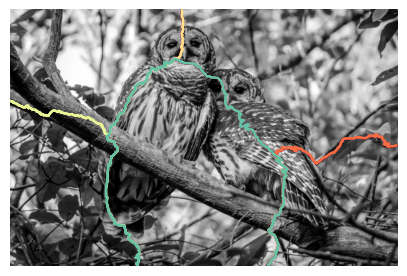

In [115]:
spectral_segmentation("duck.jpg", n_clusters=5) 
spectral_segmentation("owls.jpg", n_clusters=5)

**Для более оптимального подбора контуров необходимо перебрать параметры, что в рамках реализованного алгоритма очень долго, необходим тюнинг. Для уток разделяющая поверхность получилась весьма схожей с KMeans, но для сов получилось весьма хорошо их выделить, только на рисунке продемонстировано нек-рое смещение**

### **Задание 9 (1 балл)**

- Найдите интересную картинку милого животного и примените алгоритмы и к ней. Поэкспериментируйте с параметрами алгоритмов и постарайтесь добиться оптимального результата. Картинку нужно будет загрузить вместе с работой.

- Сравните два подхода и сегментации, к которым они приводят. Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

**Примечание:**

Слишком большие лучше не брать - считаться будет долго. Не забудьте визуализировать!


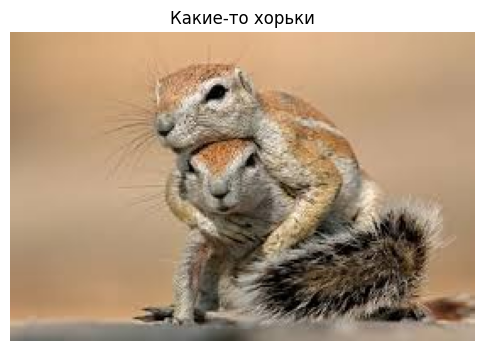

In [125]:
img = mpimg.imread('images.jpeg')
plt.figure(figsize=(6, 6)) 
plt.imshow(img)
plt.axis("off")  
plt.title("Какие-то хорьки")  
plt.show()

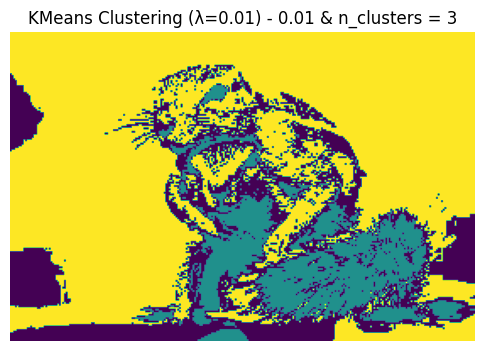

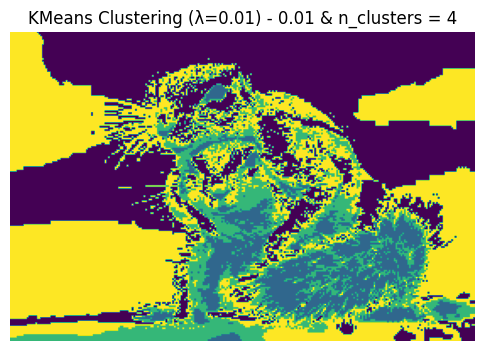

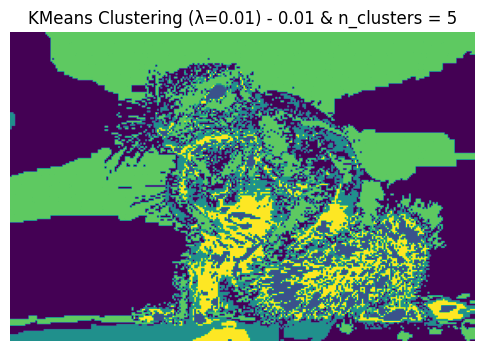

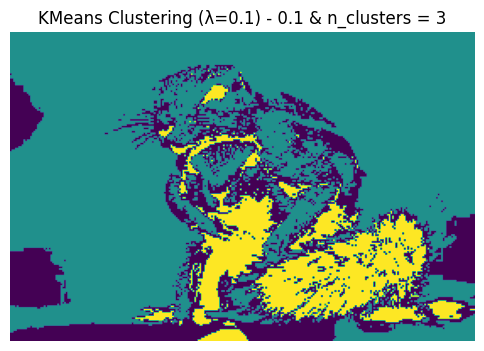

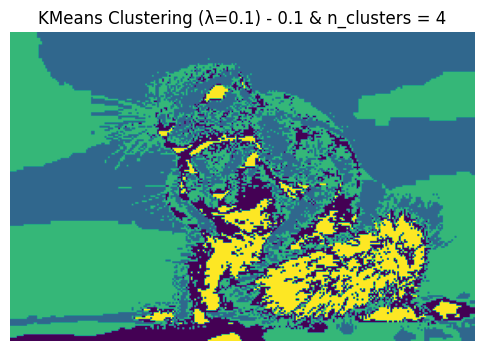

...

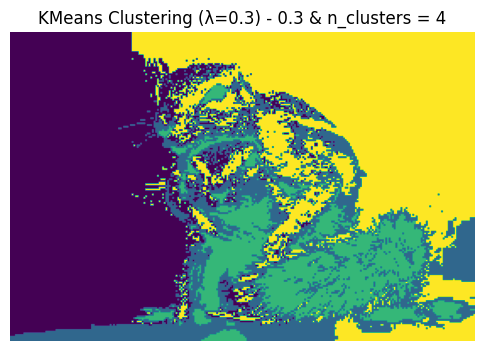

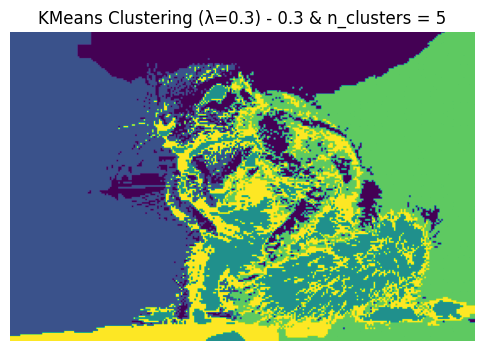

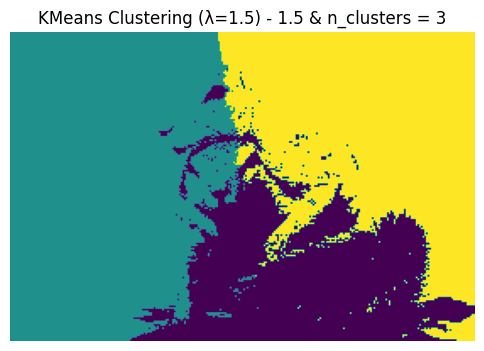

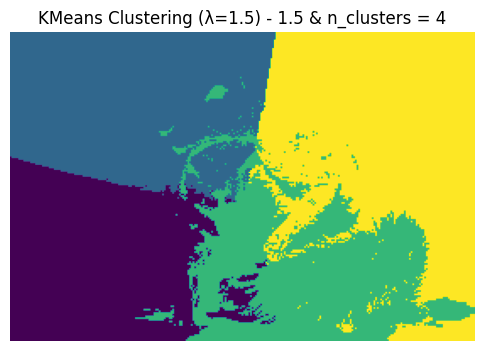

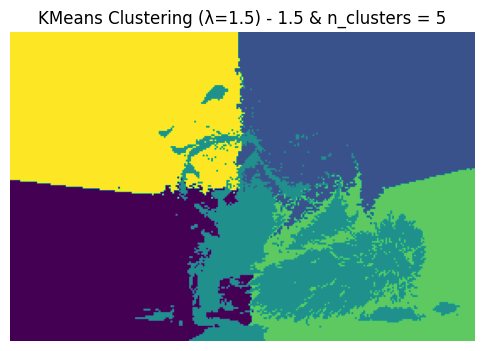

In [127]:
lambdas = [0.01, 0.1, 0.3, 1.5]
for lam in lambdas:
    for cluster in range(3, 6):
        find_components('images.jpeg', n_clusters=cluster, lmbd=lam)

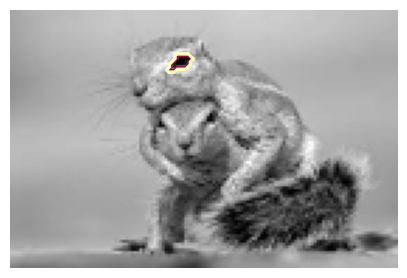

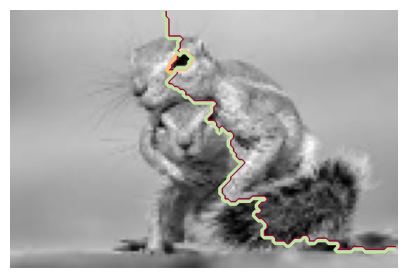

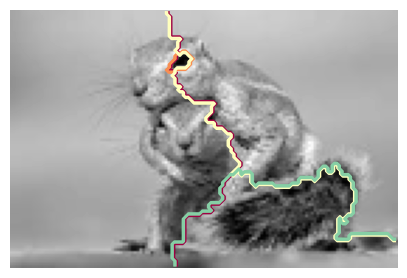

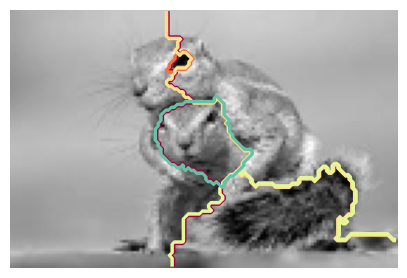

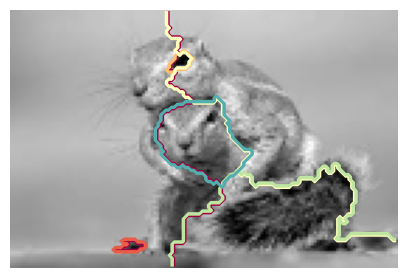

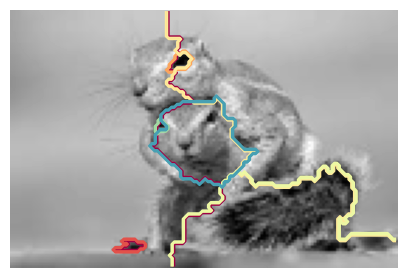

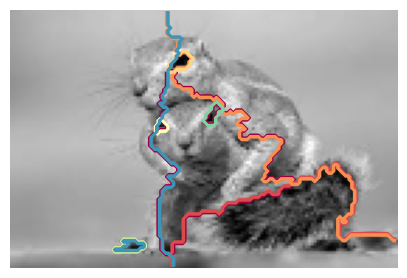

In [137]:
for i in range(2, 9):
    spectral_segmentation('images.jpeg', n_clusters=i)

**Конутры объектов хорошо видны в KMeans при кол-ве кластеров 5 и лямбде равной 0.3. Лучшие результаты по спектральной кластеризации удалось получить при кол-ве кластеров равным 8-ми, но нужно отметить, что чем больше кластеров будет передаваться, тем, потенциально, алгоритм будет находить лучшее разбиение по контурам, но смысл каждого этого кластера будет уменьшаться**

## **Бонус (1 балл)**

В качестве бонуса предлагаем вам построить алгоритм кластеризации типов движения на наборе Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 1 (0.05 балла)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [ ]:
# Ваш код здесь
X =
y =

In [ ]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

### **Задание 2 (0.05 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [ ]:
# Ваш код здесь
scaler =
X_scaled =

### **Задание 3 (0.15 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мспользуем методы **понижения размерности**. В частности, мы будем использовать метод главных компонент. Если вы проходили степик, то знакомы с ним, если нет, то почитать про PCA вам нужно в [Конспекте](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture12-factorizations.pdf).

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма массива pca.explained_variance_ratio_ должна быть больше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [ ]:
# Ваш код здесь
plt.scatter()

### **Задание 4. (0.15 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [ ]:
# Ваш код здесь

### **Задание 6 (0.05 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

In [ ]:
# Ваш код здесь

### **Задание 7 (0.1 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 8 (0.15 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 9 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Ваш ответ здесь.**

**Вы ещё здесь!** или **уже**?)

Спасибо за труд! Котобонус:

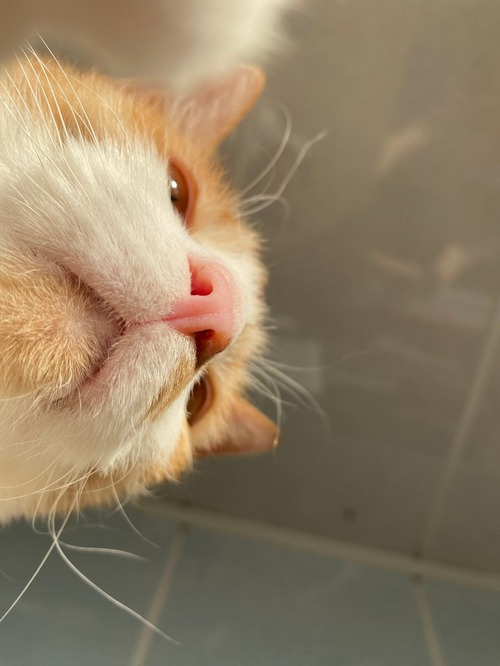

Это кот Елены !